# Modelo KNN

## Importando bibliotecas

In [1]:
# Importando bibliotecas basicas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# knn
from sklearn.neighbors import KNeighborsRegressor 

# Metricas de avaliaçao
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

# importando biblioteca para dividir em train e test
from sklearn.model_selection import train_test_split

# lof
from sklearn.neighbors import LocalOutlierFactor

## Qualidade da imagem

In [2]:
# definindo a qualidade das imagens
plt.rcParams['figure.dpi'] = 1000
plt.rcParams['savefig.dpi'] = 1000

## Importando os dados

In [3]:
nomeArquivo = 'dados.xlsx'
# importa o arquivo
df_xlsx = pd.ExcelFile(nomeArquivo, engine='openpyxl')
df = pd.read_excel(df_xlsx)
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
df['Data'] = pd.to_datetime(df['Data'])
df = df.set_index(['Data'])
# remove NaN values
df = df.dropna()
# retorna df
df.head()

,NA,pluv_mm,PZA
Data,,,
2013-04-05,845.94,0.8,21.87
2013-04-19,846.01,0.0,22.35
2013-05-03,845.79,0.0,22.27
2013-05-17,845.48,0.0,22.14
2013-05-29,845.30,0.0,22.08


## KNN

In [4]:
dfAnalise = pd.DataFrame()
# Copia os dados
dfAnalise['y'] = df['PZA']
# Cria as leituras do instante t-1
dfAnalise['x'] = dfAnalise['y'].shift(1)
dfAnalise = dfAnalise.dropna()
# retorna o df de analise
dfAnalise.head()

,y,x
Data,,
2013-04-19,22.35,21.87
2013-05-03,22.27,22.35
2013-05-17,22.14,22.27
2013-05-29,22.08,22.14
2013-06-14,22.07,22.08


## Treino e teste - 80/20

In [5]:
# dividindo o banco em treino e teste
porcentagemTreino = 0.80

porcentagemTeste = 1 - porcentagemTreino
xTreino, xTeste, yTreino, yTeste = train_test_split(dfAnalise['x'],
                                                   dfAnalise['y'],
                                                   test_size = porcentagemTeste,
                                                   random_state=21)
xTreinoReshaped = np.array(xTreino).reshape((-1, 1))
xTesteReshaped = np.array(xTeste).reshape((-1, 1))

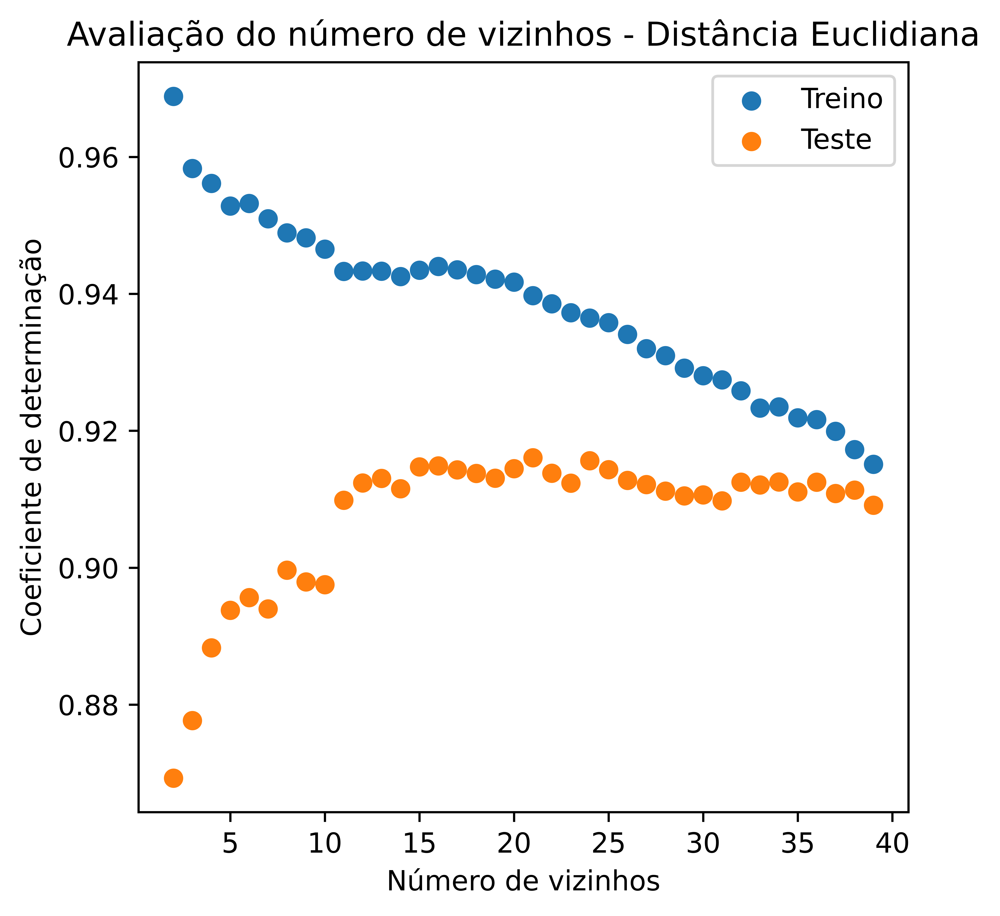

In [6]:
# Calibrando o modelo
# arrays para guardar os resultados
listaNumeroVizinhos = np.empty(0)
listaCoeficienteDeterminacaoTreino = np.empty(0)
listaCoeficienteDeterminicaoTeste = np.empty(0)
listaRMSETreino = np.empty(0)
listaRMSETeste = np.empty(0)
listeMAETreino = np.empty(0)
listaMAETeste = np.empty(0)
# modelo
for numeroVizinho in np.arange(2, 40, 1):
    knn = KNeighborsRegressor(n_neighbors = numeroVizinho)
    # salvando o numero de vizinhos
    listaNumeroVizinhos = np.append(listaNumeroVizinhos, numeroVizinho)
    knn.fit(xTreinoReshaped,yTreino)
    # predizendo valores
    yTreinoPredito = knn.predict(xTreinoReshaped)
    yTestePredito = knn.predict(xTesteReshaped) 
    # Avaliacao dos resultados coeficente de determinacao
    coeficienteDeterminacaoTreino = r2_score(yTreino, yTreinoPredito) 
    coeficienteDeterminacaoTeste = r2_score(yTeste, yTestePredito)
    # salvando coeficientes
    listaCoeficienteDeterminacaoTreino = np.append(listaCoeficienteDeterminacaoTreino, coeficienteDeterminacaoTreino)
    listaCoeficienteDeterminicaoTeste = np.append(listaCoeficienteDeterminicaoTeste, coeficienteDeterminacaoTeste)
    # RMSE
    rmseTreino = mean_squared_error(yTreino,yTreinoPredito,squared=False) 
    rmseTeste = mean_squared_error(yTeste,yTestePredito,squared=False) 
    listaRMSETreino = np.append(listaRMSETreino, rmseTreino)
    listaRMSETeste = np.append(listaRMSETeste, rmseTeste)
    #MAE
    maeTreino = mean_absolute_error(yTreino,yTreinoPredito) 
    maeTeste = mean_absolute_error(yTeste,yTestePredito)
    listeMAETreino = np.append(listeMAETreino, maeTreino)
    listaMAETeste = np.append(listaMAETeste, maeTeste)
# grafico de calibracao
fig, ax1 = plt.subplots(figsize=(5,5))
plt.scatter(listaNumeroVizinhos, listaCoeficienteDeterminacaoTreino, label='Treino')
plt.scatter(listaNumeroVizinhos, listaCoeficienteDeterminicaoTeste, label='Teste')
plt.legend()
plt.xlabel('Número de vizinhos')
plt.ylabel('Coeficiente de determinação')
plt.title('Avaliação do número de vizinhos - Distância Euclidiana')
plt.show();

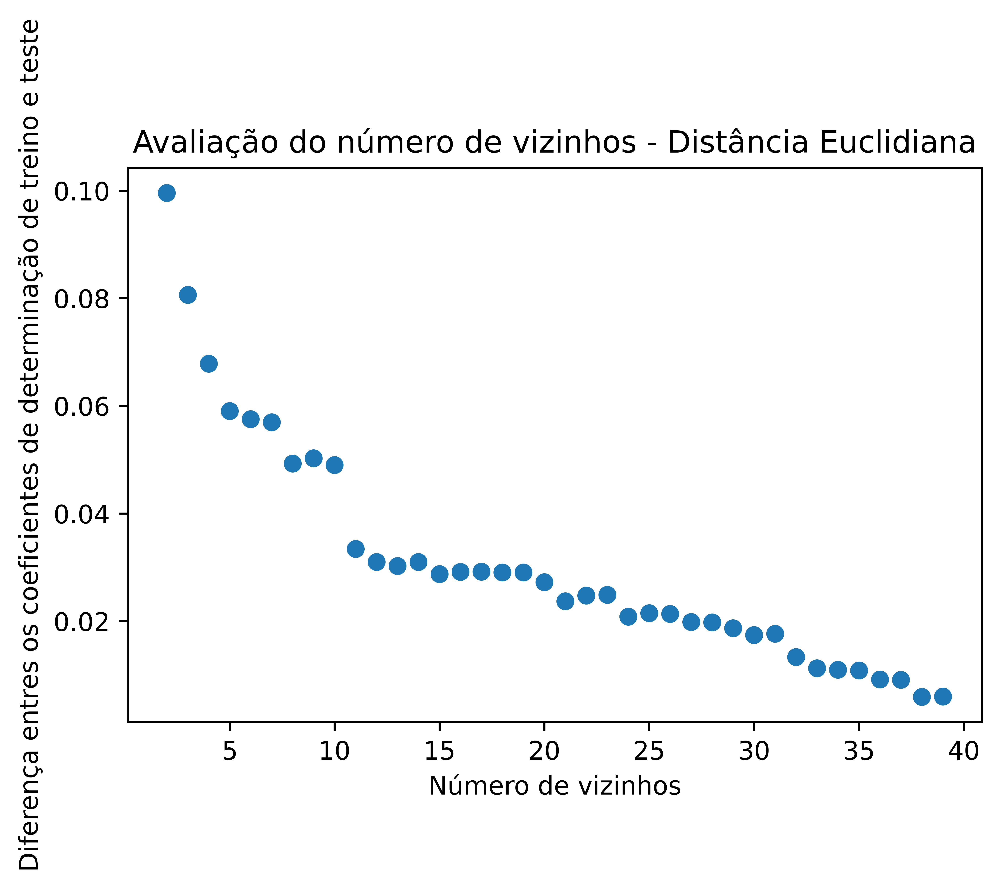

In [7]:
# diferenca entre os coeficientes
listaDiferencaCoeficientes = listaCoeficienteDeterminacaoTreino - listaCoeficienteDeterminicaoTeste
# grafico
plt.scatter(listaNumeroVizinhos, listaDiferencaCoeficientes)
plt.xlabel('Número de vizinhos')
plt.ylabel('Diferença entres os coeficientes de determinação de treino e teste')
plt.title('Avaliação do número de vizinhos - Distância Euclidiana')
plt.show();

In [8]:
# Modelo

# iniciando o modelo
knn = KNeighborsRegressor(n_neighbors = 16)
# treinando o modelo
knn.fit(xTreinoReshaped,yTreino)

# Avaliando o modelo
# predizendo valores
yTreinoPredito = knn.predict(xTreinoReshaped)
yTestePredito = knn.predict(xTesteReshaped) 
# Avaliacao dos resultados coeficente de determinacao
coeficienteDeterminacaoTreino = r2_score(yTreino, yTreinoPredito) 
print(f"O coeficiente de determinação do banco de treino é {coeficienteDeterminacaoTreino}")
coeficienteDeterminacaoTeste = r2_score(yTeste, yTestePredito)
print(f"O coeficiente de determinação do banco de teste é {coeficienteDeterminacaoTeste}")
print('-------------------------------------')
# Avaliacao dos resultados RMSE
rmseTreino = mean_squared_error(yTreino,yTreinoPredito,squared=False) 
print(f"O RMSE do banco de treino é {rmseTreino}")
rmseTeste = mean_squared_error(yTeste,yTestePredito,squared=False) 
print(f"O RMSE do banco de teste é {rmseTeste}")
print('-------------------------------------')
# Avaliacao dos resultados MAE
maeTreino = mean_absolute_error(yTreino,yTreinoPredito) 
print(f"O MAE do banco de treino é {maeTreino}")
maeTeste = mean_absolute_error(yTeste,yTestePredito)
print(f"O MAE do banco de teste é {maeTeste}")

O coeficiente de determinação do banco de treino é 0.9440181522121198
O coeficiente de determinação do banco de teste é 0.9148691172067432
-------------------------------------
O RMSE do banco de treino é 0.1597346782021264
O RMSE do banco de teste é 0.16197886852006116
-------------------------------------
O MAE do banco de treino é 0.10989601377952965
O MAE do banco de teste é 0.10066720919703531


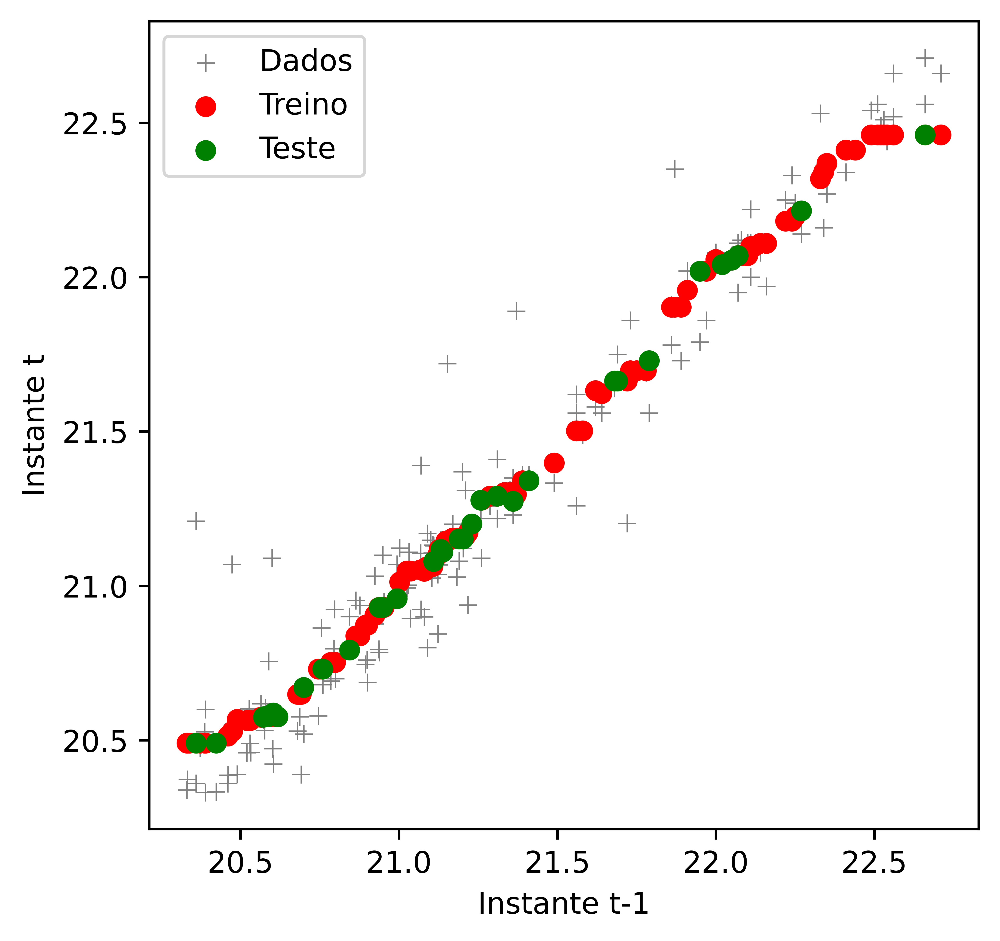

In [9]:
# grafico de autocorrelacao dos instantes t e t-1
fig, ax1 = plt.subplots(figsize = (5, 5))
sns.scatterplot(x='x', y='y', data=dfAnalise, ax=ax1, color='grey', marker='+', label = 'Dados')
ax1.scatter(xTreino, yTreinoPredito, color='red', label = 'Treino')
ax1.scatter(xTeste, yTestePredito, color='green', label = 'Teste')
ax1.legend()
plt.ylabel('Instante t')
plt.xlabel('Instante t-1');

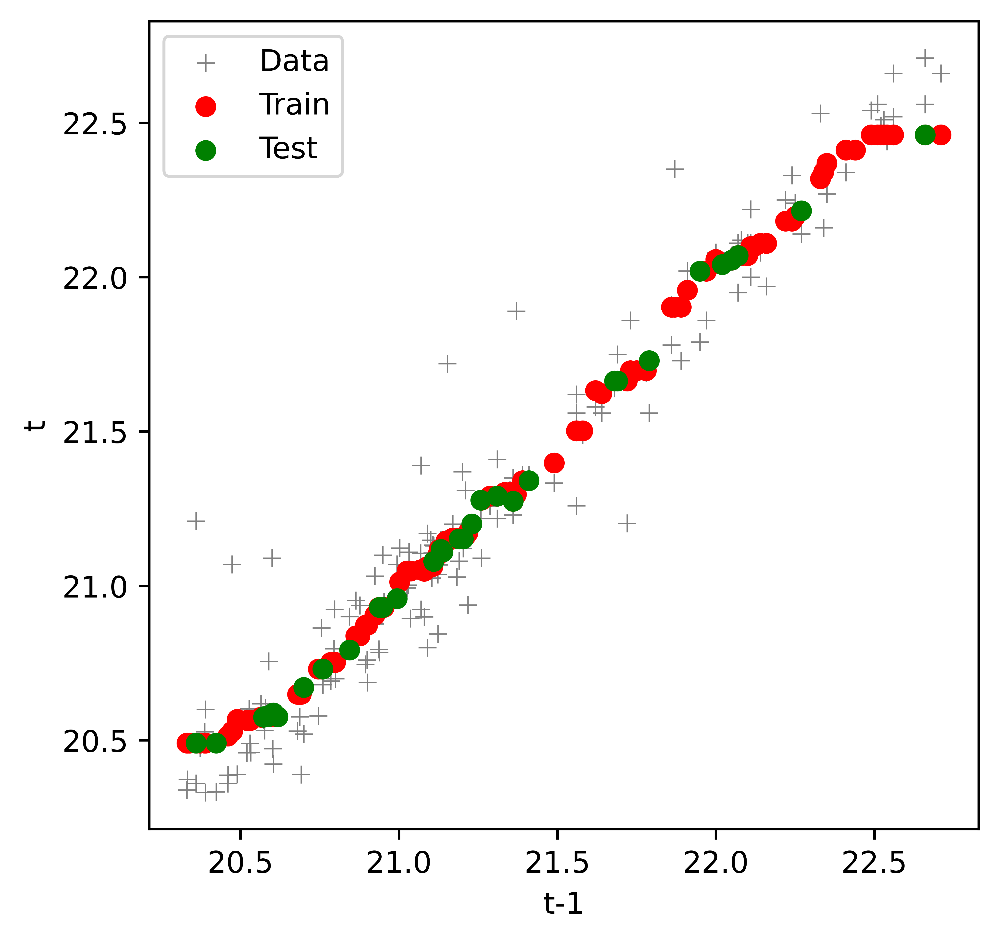

In [10]:
# grafico de autocorrelacao dos instantes t e t-1
fig, ax1 = plt.subplots(figsize = (5, 5))
sns.scatterplot(x='x', y='y', data=dfAnalise, ax=ax1, color='grey', marker='+', label = 'Data')
ax1.scatter(xTreino, yTreinoPredito, color='red', label = 'Train')
ax1.scatter(xTeste, yTestePredito, color='green', label = 'Test')
ax1.legend()
plt.ylabel('t')
plt.xlabel('t-1');

## Comparativo com 60% e 40%

In [11]:
listaNumeroVizinhos60 = [ 2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26., 27.,28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39.]

In [12]:
listaCoeficienteDeterminacaoTreino60 = [0.98374368, 0.97853388, 0.97484596, 0.97229496, 0.96770394,0.96736629, 0.96631552, 0.96512234, 0.96510529, 0.96549821,0.96477092, 0.96473492, 0.96234601, 0.96109348, 0.95900632,0.95743276, 0.95678155, 0.95458289, 0.95237331, 0.95055378,0.94876396, 0.9459374 , 0.9448541 , 0.94355461, 0.94164588,0.9377608 , 0.93299822, 0.92978092, 0.92331813, 0.9175476 ,0.91264208, 0.90764319, 0.90310693, 0.89861381, 0.891383  ,0.88503167, 0.88376128, 0.87841267]

In [13]:
listaCoeficienteDeterminicaoTeste60 = [0.84236281, 0.8536397 , 0.86291298, 0.87674131, 0.87418962,0.88050301, 0.88235532, 0.88487382, 0.88956673, 0.8941821 ,0.89313446, 0.8952697 , 0.89619048, 0.89836417, 0.89767463,0.89782098, 0.89734604, 0.89608114, 0.89632835, 0.89814796,0.90042033, 0.89919939, 0.89932966, 0.89968319, 0.90006187,0.89952474, 0.89912492, 0.89762144, 0.89581247, 0.89404323,0.89101789, 0.88884835, 0.88544126, 0.88314839, 0.87992498,0.87650695, 0.87423943, 0.86873368]

In [14]:
listaRMSETreino60 = [0.08740436, 0.10043814, 0.1087241 , 0.11410412, 0.12319602,
       0.12383835, 0.12581629, 0.12802524, 0.12805654, 0.12733352,
       0.1286686 , 0.12873432, 0.13302321, 0.13521758, 0.13879711,
       0.14143591, 0.14251368, 0.14609376, 0.14960535, 0.15243633,
       0.1551707 , 0.15939343, 0.16098246, 0.16286815, 0.165599  ,
       0.17102277, 0.17744555, 0.1816559 , 0.18983151, 0.19684464,
       0.20261569, 0.2083322 , 0.21338717, 0.21827869, 0.2259284 ,
       0.2324401 , 0.23372079, 0.23903754]

In [15]:
listaRMSETeste60 = [0.24041733, 0.23165841, 0.22419948, 0.21259116, 0.21478041,
       0.20932201, 0.20769334, 0.20545819, 0.20122707, 0.19697722,
       0.1979499 , 0.19596233, 0.19509899, 0.19304557, 0.19369932,
       0.19356075, 0.19401008, 0.19520171, 0.19496939, 0.1932508 ,
       0.19108288, 0.19225073, 0.19212647, 0.19178882, 0.19142649,
       0.19194023, 0.19232173, 0.19374966, 0.19545388, 0.19710642,
       0.19990057, 0.20188051, 0.20495124, 0.20699211, 0.20982767,
       0.21279317, 0.21473789, 0.21938811]

In [16]:
listeMAETreino60 = [0.06120263, 0.07222947, 0.07850132, 0.08238758, 0.09075018,
       0.09000571, 0.09068987, 0.09376994, 0.09354   , 0.09363474,
       0.0925057 , 0.09244802, 0.09577617, 0.09576961, 0.09878461,
       0.10230254, 0.10246485, 0.10441922, 0.10698242, 0.1088189 ,
       0.11227574, 0.11554412, 0.11703934, 0.11768733, 0.12033251,
       0.12404483, 0.12965711, 0.133151  , 0.13954923, 0.1455545 ,
       0.14996572, 0.15411796, 0.15869155, 0.16300698, 0.16944649,
       0.17510168, 0.17611931, 0.18048389]

In [17]:
listaMAETeste60 = [0.17660607, 0.16836049, 0.1586631 , 0.14804622, 0.1464006 ,
       0.14044546, 0.13888243, 0.13712143, 0.1356506 , 0.13350188,
       0.13626284, 0.13360637, 0.13368285, 0.13217549, 0.13424278,
       0.13415345, 0.131919  , 0.13150578, 0.13032872, 0.13055811,
       0.12949009, 0.13094509, 0.13350802, 0.1348096 , 0.13502452,
       0.13735517, 0.13591756, 0.13590658, 0.13554148, 0.13703593,
       0.1376715 , 0.14036182, 0.14301406, 0.14485377, 0.14981236,
       0.15375106, 0.15732547, 0.16252724]

In [18]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(15,5))
# ax1
ax1.plot(listaNumeroVizinhos60, listaCoeficienteDeterminacaoTreino60, label='Treino 60%', linestyle='dashed')
ax1.plot(listaNumeroVizinhos60, listaCoeficienteDeterminicaoTeste60, label='Teste 40%', linestyle='dashed')
ax1.plot(listaNumeroVizinhos, listaCoeficienteDeterminacaoTreino, label='Treino 80%')
ax1.plot(listaNumeroVizinhos, listaCoeficienteDeterminicaoTeste, label='Teste 20%')
ax1.axvline(x = 16, color = 'red', linestyle = '--', label='16 vizinhos')
ax1.legend()
ax1.set_xlabel('Número de vizinhos')
ax1.set_ylabel('Coeficiente de determinação (R²)')
# ax2
ax2.plot(listaNumeroVizinhos60, listaRMSETreino60, label='Treino 60%', linestyle='dashed')
ax2.plot(listaNumeroVizinhos60, listaRMSETeste60, label='Teste 40%', linestyle='dashed')
ax2.plot(listaNumeroVizinhos, listaRMSETreino, label='Treino 80%')
ax2.plot(listaNumeroVizinhos, listaRMSETeste, label='Teste 20%')
ax2.axvline(x = 16, color = 'red', linestyle = '--', label='16 vizinhos')
ax2.legend()
ax2.set_xlabel('Número de vizinhos')
ax2.set_ylabel('Raiz do erro médio ao quadrado (RMSE)')
# ax3
ax3.plot(listaNumeroVizinhos60, listeMAETreino60, label='Treino 60%', linestyle='dashed')
ax3.plot(listaNumeroVizinhos60, listaMAETeste60, label='Teste 40%', linestyle='dashed')
ax3.plot(listaNumeroVizinhos, listeMAETreino, label='Treino 80%')
ax3.plot(listaNumeroVizinhos, listaMAETeste, label='Teste 20%')
ax3.axvline(x = 16, color = 'red', linestyle = '--', label='16 vizinhos')
ax3.legend()
ax3.set_xlabel('Número de vizinhos')
ax3.set_ylabel('Erro Médio Absoluto (MAE)')
plt.show();

In [21]:
listaDiferencaCoeficientes60 = np.array(listaCoeficienteDeterminacaoTreino60) - np.array(listaCoeficienteDeterminicaoTeste60)

In [22]:
listaDiferencaRMSE60 = np.array(listaRMSETreino60) - np.array(listaRMSETeste60)
listaDiferencaRMSE = np.array(listaRMSETreino) - np.array(listaRMSETeste)

In [23]:
listaDiferencaMAE60 = np.array(listeMAETreino60) - np.array(listaMAETeste60)
listaDiferencaMAE = np.array(listeMAETreino) - np.array(listaMAETeste)

In [24]:
listaDiferencaMAE

array([-0.05265714, -0.03378184, -0.02214155, -0.01507433, -0.01535326,
       -0.009159  , -0.00279724, -0.00435883, -0.00503898,  0.00437379,
        0.00554986,  0.0080147 ,  0.00898645,  0.01145616,  0.0092288 ,
        0.01049714,  0.0112559 ,  0.01063897,  0.01423396,  0.01546615,
        0.01523731,  0.01568298,  0.02107432,  0.02136003,  0.02067546,
        0.01993314,  0.01932571,  0.0197426 ,  0.02090874,  0.02180485,
        0.02379064,  0.0258212 ,  0.02552221,  0.02611817,  0.02550619,
        0.02548737,  0.02804723,  0.03074448])

In [25]:
# diferenca entre os coeficientes
# grafico
fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize=(20,5))
#ax1
ax1.plot(listaNumeroVizinhos, listaDiferencaCoeficientes, label= '80% treino e 20% teste')
ax1.plot(listaNumeroVizinhos60, listaDiferencaCoeficientes60, label = '60% treino e 40 teste')
ax1.axhline(y = 0, color = 'red', linestyle = '--', label='Diferença = 0')
ax1.axvline(x = 16, color = 'red', linestyle = '--', label='16 vizinhos')
ax1.legend()
ax1.set_xlabel('Número de vizinhos')
ax1.set_ylabel('Diferença entre os valores de R² de treino e teste')
#ax2
ax2.plot(listaNumeroVizinhos, listaDiferencaRMSE, label= '80% treino e 20% teste')
ax2.plot(listaNumeroVizinhos60, listaDiferencaRMSE60, label = '60% treino e 40 teste')
ax2.axhline(y = 0, color = 'red', linestyle = '--', label='Diferença = 0')
ax2.axvline(x = 16, color = 'red', linestyle = '--', label='16 vizinhos')
ax2.legend()
ax2.set_xlabel('Número de vizinhos')
ax2.set_ylabel('Diferença entre os valores de RMSE de treino e teste')
#ax3
ax3.plot(listaNumeroVizinhos, listaDiferencaMAE, label= '80% treino e 20% teste')
ax3.plot(listaNumeroVizinhos60, listaDiferencaMAE60, label = '60% treino e 40 teste')
ax3.axhline(y = 0, color = 'red', linestyle = '--', label='Diferença = 0')
ax3.axvline(x = 16, color = 'red', linestyle = '--', label='16 vizinhos')
ax3.legend()
ax3.set_xlabel('Número de vizinhos')
ax3.set_ylabel('Diferença entre os valores de MAE de treino e teste')
plt.show();

## Salvando os resultados

In [26]:
# Criando DF de resultados
dfResultado = pd.DataFrame()
# index
index = np.append(xTreino.index, xTeste.index)
dfResultado['Data'] = index
# Salvando o valor de X
xResultado = np.append(xTreino, xTeste)
dfResultado['x'] = xResultado
# Salvando o valor de y
yResultado = np.append(yTreino, yTeste)
dfResultado['y'] = yResultado
# Salvando os valores preditos
yResultadoPredito = np.append(yTreinoPredito, yTestePredito)
dfResultado['y_pred'] = yResultadoPredito
# Calculando resíduos
dfResultado['resid'] = dfResultado['y'] - dfResultado['y_pred']
dfResultado['resid_abs'] = dfResultado['resid'].abs()

In [27]:
dfResultado

,Data,x,y,y_pred,resid,resid_abs
0,2020-04-22,21.3500,21.3100,21.302850,0.007150,0.007150
1,2017-06-14,21.0023,21.1224,21.013331,0.109069,0.109069
2,2020-07-17,21.2180,20.9384,21.173137,-0.234737,0.234737
3,2015-04-29,21.7300,21.8600,21.697069,0.162931,0.162931
4,2015-11-26,22.1100,22.2200,22.099375,0.120625,0.120625
...,...,...,...,...,...,...
154,2016-11-24,21.6800,21.6400,21.664137,-0.024137,0.024137
155,2018-08-21,20.9939,21.0700,20.958869,0.111131,0.111131
156,2019-01-09,21.1097,21.1302,21.079269,0.050931,0.050931
157,2013-07-29,21.7900,21.5600,21.729569,-0.169569,0.169569


In [28]:
# Salvando os resultados
nome_arquivo = "resultadosPZA.xlsx"
dfResultado.to_excel(nome_arquivo)

## Análise dos resíduos

Text(0.5, 0, 'Leitura no instante t-1')

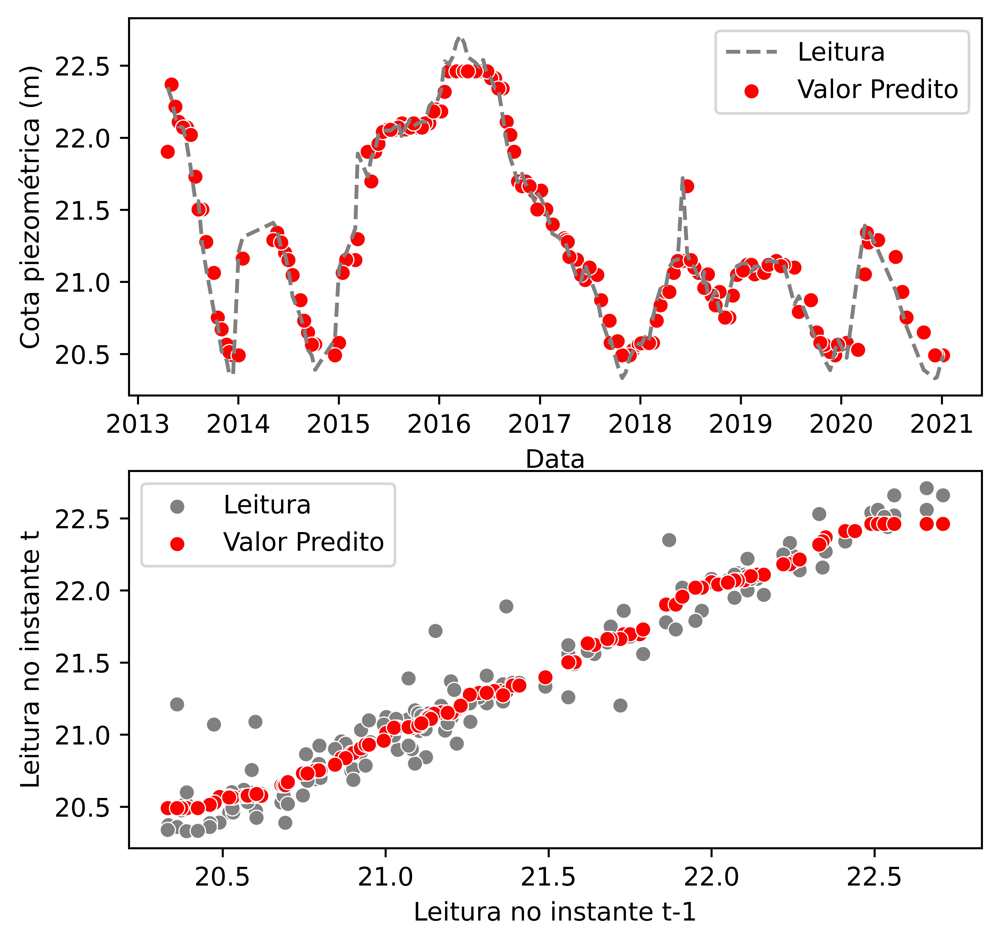

In [29]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize = (6, 6))

banco = dfResultado

# Gráfico dos valores reais e preditos no tempo
sns.lineplot(x='Data', y='y', data=banco, label='Leitura', ax=ax1, color='gray', linestyle='--')
sns.scatterplot(x='Data', y='y_pred', data=banco, label='Valor Predito', ax=ax1, color='red')
ax1.set_ylabel('Cota piezométrica (m)')

#Leitura passada vs leitura futura
sns.scatterplot(x='x', y='y', data=banco, label='Leitura', ax=ax2, color='gray')
sns.scatterplot(x='x', y='y_pred', data=banco, label='Valor Predito', ax=ax2, color='red')
ax2.set_ylabel('Leitura no instante t')
ax2.set_xlabel('Leitura no instante t-1')

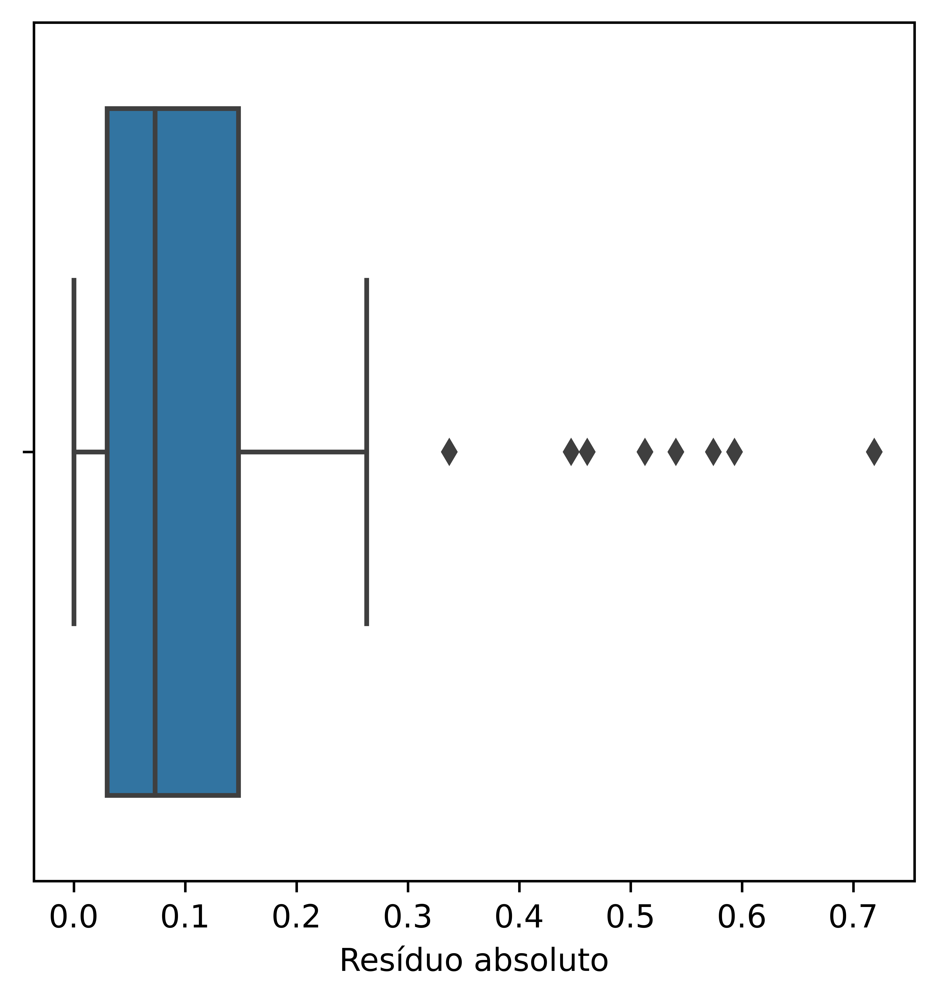

In [30]:
# box-plot
f, (ax1) = plt.subplots(figsize = (5, 5))
sns.boxplot(x='resid_abs', data=dfResultado)
ax1.set_xlabel('Resíduo absoluto');

In [31]:
dfResultado.describe()

,x,y,y_pred,resid,resid_abs
count,159.000000,159.000000,159.000000,159.000000,1.590000e+02
mean,21.328832,21.320147,21.315613,0.004534,1.080386e-01
std,0.654701,0.656633,0.629121,0.160631,1.186451e-01
min,20.331200,20.331200,20.491062,-0.461038,2.842171e-14
25%,20.822250,20.798450,20.772575,-0.099062,2.988438e-02
50%,21.153000,21.148400,21.145431,-0.001962,7.295625e-02
75%,21.900000,21.900000,21.930409,0.060028,1.478281e-01
max,22.710000,22.710000,22.461250,0.718937,7.189375e-01


## IQR

In [32]:
# primeiro quartil
primeiroQuartil = np.quantile(dfResultado['resid_abs'], [0.25])
primeiroQuartil = primeiroQuartil[0]
#terceiro quartil
terceiroQuartil = np.quantile(dfResultado['resid_abs'], [0.75])
terceiroQuartil = terceiroQuartil[0]
# IQR
iqr = terceiroQuartil - primeiroQuartil
# Limite superior
limiteSuperior = terceiroQuartil + iqr*1.5
print(f'O limite superior é {limiteSuperior}')

O limite superior é 0.3247437499999055


In [33]:
dfAnomaliaIqr = dfResultado.loc[dfResultado['resid_abs'] >= limiteSuperior]

In [34]:
dfAnomaliaIqr

,Data,x,y,y_pred,resid,resid_abs
7,2013-04-19,21.8700,22.3500,21.903319,0.446681,0.446681
17,2018-06-04,21.1530,21.7198,21.145431,0.574369,0.574369
18,2020-03-02,20.4733,21.0700,20.529306,0.540694,0.540694
23,2020-03-27,21.0700,21.3900,21.052719,0.337281,0.337281
45,2015-01-02,20.6000,21.0900,20.577094,0.512906,0.512906
104,2015-03-11,21.3700,21.8900,21.296612,0.593387,0.593387
123,2018-06-20,21.7198,21.2031,21.664137,-0.461038,0.461038
134,2014-01-02,20.3600,21.2100,20.491062,0.718937,0.718937


## Distribuição

In [35]:
# limite superior distribuição
limiteSuperiorDistribuicao = 0.371
dfAnomaliaDistribuicao = dfResultado.loc[dfResultado['resid_abs'] >= limiteSuperiorDistribuicao]

In [36]:
dfAnomaliaDistribuicao

,Data,x,y,y_pred,resid,resid_abs
7,2013-04-19,21.8700,22.3500,21.903319,0.446681,0.446681
17,2018-06-04,21.1530,21.7198,21.145431,0.574369,0.574369
18,2020-03-02,20.4733,21.0700,20.529306,0.540694,0.540694
45,2015-01-02,20.6000,21.0900,20.577094,0.512906,0.512906
104,2015-03-11,21.3700,21.8900,21.296612,0.593387,0.593387
123,2018-06-20,21.7198,21.2031,21.664137,-0.461038,0.461038
134,2014-01-02,20.3600,21.2100,20.491062,0.718937,0.718937


## LoF

In [37]:
# criando df
dfLof = pd.DataFrame()
dfLof['x'] = dfResultado['x']
dfLof['y'] = dfResultado['y']
dfLof['resid_abs'] = dfResultado['resid_abs']
# modelo
lof = LocalOutlierFactor(n_neighbors = 13)
outPred = lof.fit_predict(dfLof)
# Anomalias
dfLof['lof'] = outPred
dfLof['lof Anomalia'] = dfLof['lof'].map({-1: 'Anomalia', 1: 'Leitura Normal'})
# Salvando a data
dfLof['Data'] = dfResultado['Data']
# Salvando a y pred
dfLof['y_pred'] = dfResultado['y_pred']

In [38]:
dfAnomaliaLof = dfLof.loc[dfLof['lof Anomalia'] == 'Anomalia']

In [39]:
dfAnomaliaLof

,x,y,resid_abs,lof,lof Anomalia,Data,y_pred
2,21.2180,20.9384,0.234737,-1,Anomalia,2020-07-17,21.173137
7,21.8700,22.3500,0.446681,-1,Anomalia,2013-04-19,21.903319
13,21.2600,21.0900,0.187763,-1,Anomalia,2013-09-06,21.277762
17,21.1530,21.7198,0.574369,-1,Anomalia,2018-06-04,21.145431
18,20.4733,21.0700,0.540694,-1,Anomalia,2020-03-02,20.529306
23,21.0700,21.3900,0.337281,-1,Anomalia,2020-03-27,21.052719
45,20.6000,21.0900,0.512906,-1,Anomalia,2015-01-02,20.577094
104,21.3700,21.8900,0.593387,-1,Anomalia,2015-03-11,21.296612
123,21.7198,21.2031,0.461038,-1,Anomalia,2018-06-20,21.664137
134,20.3600,21.2100,0.718937,-1,Anomalia,2014-01-02,20.491062


In [40]:
dfLofSorted = dfLof.sort_values(by=['Data'])
# Diferença de data
dfLofSorted['intervaloEntreDatas'] = dfLofSorted['Data'].diff(1)
# Anomalias
dfLofSortedAnomalia = dfLofSorted.loc[dfLofSorted['lof Anomalia'] == 'Anomalia']
# ID
numAnomalias = len(dfLofSortedAnomalia['x'])
dfLofSortedAnomalia['id'] = np.arange(0, numAnomalias, 1)

<ipython-input-40-c9f1cec9b79a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfLofSortedAnomalia['id'] = np.arange(0, numAnomalias, 1)


In [41]:
dfLofSortedAnomalia

,x,y,resid_abs,lof,lof Anomalia,Data,y_pred,intervaloEntreDatas,id
7,21.8700,22.3500,0.446681,-1,Anomalia,2013-04-19,21.903319,NaT,0
13,21.2600,21.0900,0.187763,-1,Anomalia,2013-09-06,21.277762,14 days,1
134,20.3600,21.2100,0.718937,-1,Anomalia,2014-01-02,20.491062,20 days,2
45,20.6000,21.0900,0.512906,-1,Anomalia,2015-01-02,20.577094,15 days,3
104,21.3700,21.8900,0.593387,-1,Anomalia,2015-03-11,21.296612,9 days,4
17,21.1530,21.7198,0.574369,-1,Anomalia,2018-06-04,21.145431,18 days,5
123,21.7198,21.2031,0.461038,-1,Anomalia,2018-06-20,21.664137,16 days,6
18,20.4733,21.0700,0.540694,-1,Anomalia,2020-03-02,20.529306,41 days,7
23,21.0700,21.3900,0.337281,-1,Anomalia,2020-03-27,21.052719,25 days,8
2,21.2180,20.9384,0.234737,-1,Anomalia,2020-07-17,21.173137,64 days,9


In [42]:
numAnomalias

10

## Resultados

In [43]:
f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, figsize = (15, 10))

# Resultados distribuição
#ax1
sns.scatterplot(x='x', y='resid_abs', data=dfResultado, label='Leitura', ax=ax1, color='gray', marker='+')
sns.scatterplot(x='x', y='resid_abs', data=dfAnomaliaDistribuicao, ax=ax1, color='red', label='Anomalia Distribuição')
ax1.axhline(y = limiteSuperiorDistribuicao, color = 'red', linestyle = '--', label='Limite Distribuição')

ax1.set_ylabel('Resíduo absoluto')
ax1.set_xlabel('Leitura no instante t-1')
#ax4
sns.scatterplot(x='x', y='y', data=dfResultado, label='Leitura', ax=ax4, color='gray', marker='+')

sns.scatterplot(x='x', y='y', data=dfAnomaliaDistribuicao, ax=ax4, color='red', label='Anomalia Distribuição')

ax4.set_ylabel('Leitura no instante t')
ax4.set_xlabel('Leitura no instante t-1');

# Resultados IQR
#ax2
sns.scatterplot(x='x', y='resid_abs', data=dfResultado, label='Leitura', ax=ax2, color='gray', marker='+')
sns.scatterplot(x='x', y='resid_abs', data=dfAnomaliaIqr, ax=ax2, color='red', label='Anomalia IQR')
ax2.axhline(y = limiteSuperior, color = 'red', linestyle = '--', label='Limite IQR')

ax2.set_ylabel('Resíduo absoluto')
ax2.set_xlabel('Leitura no instante t-1')
#ax5
sns.scatterplot(x='x', y='y', data=dfResultado, label='Leitura', ax=ax5, color='gray', marker='+')

sns.scatterplot(x='x', y='y', data=dfAnomaliaIqr, ax=ax5, color='red', label='Anomalia IQR')

ax5.set_ylabel('Leitura no instante t')
ax5.set_xlabel('Leitura no instante t-1');

# Resultados LOF
#ax3
sns.scatterplot(x='x', y='resid_abs', data=dfResultado, label='Leitura', ax=ax3, color='gray', marker='+')
sns.scatterplot(x='x', y='resid_abs', data=dfAnomaliaLof, ax=ax3, color='red', label='Anomalia LoF')

ax3.set_ylabel('Resíduo absoluto')
ax3.set_xlabel('Leitura no instante t-1')
#ax6
sns.scatterplot(x='x', y='y', data=dfResultado, label='Leitura', ax=ax6, color='gray', marker='+')

sns.scatterplot(x='x', y='y', data=dfAnomaliaLof, ax=ax6, color='red', label='Anomalia LoF')

ax6.set_ylabel('Leitura no instante t')
ax6.set_xlabel('Leitura no instante t-1');

In [44]:
f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize = (10, 10))

# Resultados distribuição
#ax1
sns.lineplot(x='Data', y='y', data=dfResultado, ax=ax1, color='gray', linestyle='--')

sns.scatterplot(x='Data', y='y', data=dfLofSortedAnomalia, ax=ax1, hue='id', palette='tab20')

ax1.set_ylabel('Cota piezométrica (m)')
# Shrink current axis by 20%
box = ax1.get_position()
ax1.set_position([box.x0, box.y0, box.width * 0.8, box.height])
# Put a legend to the right of the current axis
ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))

#ax2
sns.scatterplot(x='x', y='y', data=dfResultado, ax=ax2, color='gray', marker='+')

sns.scatterplot(x='x', y='y', data=dfLofSortedAnomalia, ax=ax2, hue='id', palette='tab20')

ax2.set_ylabel('Leitura no instante t')
ax2.set_xlabel('Leitura no instante t-1')
# Shrink current axis by 20%
box = ax2.get_position()
ax2.set_position([box.x0, box.y0, box.width * 0.8, box.height])
# Put a legend to the right of the current axis
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))

#ax3
sns.scatterplot(x='x', y='resid_abs', data=dfResultado, ax=ax3, color='gray', marker='+')

sns.scatterplot(x='x', y='resid_abs', data=dfLofSortedAnomalia, ax=ax3, hue='id', palette='tab20')

ax3.axhline(y = limiteSuperiorDistribuicao, color = 'red', linestyle = '--', label='Limite Distribuição')
ax3.axhline(y = limiteSuperior, color = 'black', linestyle = '--', label='Limite IQR')


ax3.set_ylabel('Leitura no instante t')
ax3.set_xlabel('Residuo Absoluto')
# Shrink current axis by 20%
box = ax3.get_position()
ax3.set_position([box.x0, box.y0, box.width * 0.8, box.height])
# Put a legend to the right of the current axis
ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [46]:
dfAnomaliaLof

,x,y,resid_abs,lof,lof Anomalia,Data,y_pred
2,21.2180,20.9384,0.234737,-1,Anomalia,2020-07-17,21.173137
7,21.8700,22.3500,0.446681,-1,Anomalia,2013-04-19,21.903319
13,21.2600,21.0900,0.187763,-1,Anomalia,2013-09-06,21.277762
17,21.1530,21.7198,0.574369,-1,Anomalia,2018-06-04,21.145431
18,20.4733,21.0700,0.540694,-1,Anomalia,2020-03-02,20.529306
23,21.0700,21.3900,0.337281,-1,Anomalia,2020-03-27,21.052719
45,20.6000,21.0900,0.512906,-1,Anomalia,2015-01-02,20.577094
104,21.3700,21.8900,0.593387,-1,Anomalia,2015-03-11,21.296612
123,21.7198,21.2031,0.461038,-1,Anomalia,2018-06-20,21.664137
134,20.3600,21.2100,0.718937,-1,Anomalia,2014-01-02,20.491062


In [47]:
dfAnomaliaDistribuicao

,Data,x,y,y_pred,resid,resid_abs
7,2013-04-19,21.8700,22.3500,21.903319,0.446681,0.446681
17,2018-06-04,21.1530,21.7198,21.145431,0.574369,0.574369
18,2020-03-02,20.4733,21.0700,20.529306,0.540694,0.540694
45,2015-01-02,20.6000,21.0900,20.577094,0.512906,0.512906
104,2015-03-11,21.3700,21.8900,21.296612,0.593387,0.593387
123,2018-06-20,21.7198,21.2031,21.664137,-0.461038,0.461038
134,2014-01-02,20.3600,21.2100,20.491062,0.718937,0.718937


In [48]:
dfAnomaliaIqr

,Data,x,y,y_pred,resid,resid_abs
7,2013-04-19,21.8700,22.3500,21.903319,0.446681,0.446681
17,2018-06-04,21.1530,21.7198,21.145431,0.574369,0.574369
18,2020-03-02,20.4733,21.0700,20.529306,0.540694,0.540694
23,2020-03-27,21.0700,21.3900,21.052719,0.337281,0.337281
45,2015-01-02,20.6000,21.0900,20.577094,0.512906,0.512906
104,2015-03-11,21.3700,21.8900,21.296612,0.593387,0.593387
123,2018-06-20,21.7198,21.2031,21.664137,-0.461038,0.461038
134,2014-01-02,20.3600,21.2100,20.491062,0.718937,0.718937
